##  ***Mongolian Food Classifier***


*   Khuushuur
*   Tsuivan 
*   Buuz



### Checking GPU 

In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Select the Runtime > "Change runtime type" menu to enable a GPU accelerator, ')
  print('and then re-execute this cell.')
else:
  print(gpu_info)

Tue Feb  9 13:29:22 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.39       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P4            Off  | 00000000:00:04.0 Off |                  N/A |
| N/A   41C    P8     6W /  75W |      0MiB /  7611MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

### Package Installation and Imports

In [ ]:
!pip install -Uqq fastai --upgrade
!pip install -Uqq fastcore

     |████████████████████████████████| 194kB 6.4MB/s 
     |████████████████████████████████| 61kB 5.6MB/s 


In [ ]:
import fastai
import fastcore
print('Fast.ai version:', fastai.__version__)
print('Fastcore version:', fastcore.__version__)

Fast.ai version: 2.2.5
Fastcore version: 1.3.19


In [ ]:
from fastai.vision.all import * 
from fastai.vision.widgets import *

In [ ]:
!pip install -Uqq azure-cognitiveservices-search-imagesearch
from azure.cognitiveservices.search.imagesearch import ImageSearchClient as api
from msrest.authentication import CognitiveServicesCredentials as auth

     |████████████████████████████████| 51kB 3.5MB/s 
     |████████████████████████████████| 40kB 4.5MB/s 
     |████████████████████████████████| 92kB 6.0MB/s 
     |████████████████████████████████| 61kB 5.2MB/s 
     |████████████████████████████████| 51kB 5.4MB/s 
     |████████████████████████████████| 3.2MB 7.7MB/s 


In [ ]:
!pip install -Uqq anvil-uplink

     |████████████████████████████████| 61kB 3.9MB/s 
     |████████████████████████████████| 61kB 6.0MB/s 


## Seeting a directory

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd '/content/drive/MyDrive/Deep Learning/'

/content/drive/MyDrive/Deep Learning


In [ ]:
%ls

### Gathering Data

In [ ]:
key = os.environ.get('AZURE_SEARCH_KEY', '161433e0da0b4f168658a54201b384e9')

In [ ]:
def search_images_bing(key, term, min_sz=128, max_images=150):    
     params = {'q':term, 'count':max_images, 'min_height':min_sz, 'min_width':min_sz}
     headers = {"Ocp-Apim-Subscription-Key":key}
     search_url = "https://api.bing.microsoft.com/v7.0/images/search"
     response = requests.get(search_url, headers=headers, params=params)
     response.raise_for_status()
     search_results = response.json()    
     return L(search_results['value'])

In [ ]:
food_types = 'buuz', 'khuushuur', 'tsuivan'
path = Path('foods')

In [ ]:
food_types

('buuz', 'khuushuur', 'tsuivan')

In [ ]:
if not path.exists():
    path.mkdir()
    for o in food_types:
        print(f'Finding images for {o}')
        dest = (path/o)
        dest.mkdir(exist_ok=True)
        results = search_images_bing(key, f'{o}')
        download_images(dest, urls=results.attrgot('contentUrl'))

Finding images for buuz
Finding images for khuushuur
Finding images for tsuivan


In [ ]:
fns = get_image_files(path)
fns

(#401) [Path('foods/buuz/00000000.jpg'),Path('foods/buuz/00000004.jpg'),Path('foods/buuz/00000001.jpg'),Path('foods/buuz/00000002.JPG'),Path('foods/buuz/00000003.jpg'),Path('foods/buuz/00000005.JPG'),Path('foods/buuz/00000009.jpg'),Path('foods/buuz/00000008.jpg'),Path('foods/buuz/00000006.jpg'),Path('foods/buuz/00000010.jpg')...]

In [ ]:
failed = verify_images(fns)
failed

(#6) [Path('foods/khuushuur/00000059.jpg'),Path('foods/khuushuur/00000088.jpg'),Path('foods/khuushuur/00000115.jpg'),Path('foods/khuushuur/00000140.jpg'),Path('foods/khuushuur/00000145.jpg'),Path('foods/tsuivan/00000115.jpg')]

In [ ]:
failed.map(Path.unlink)

(#6) [None,None,None,None,None,None]

### Building Data Loader

In [ ]:
foods = DataBlock(blocks=(ImageBlock, CategoryBlock),
                    get_items=get_image_files,
                    splitter=RandomSplitter(valid_pct=0.2, seed=42),
                    get_y=parent_label,
                    item_tfms=RandomResizedCrop(224, min_scale=0.5), 
                    batch_tfms=aug_transforms())

In [ ]:
dls = foods.dataloaders(path)

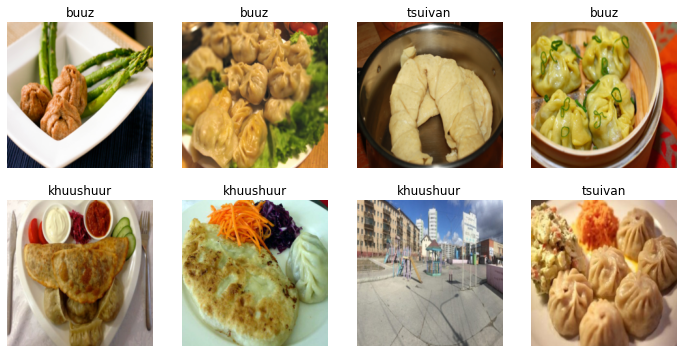

In [ ]:
dls.valid.show_batch(max_n=8, nrows=2)

#### Checking the img result

In [ ]:
results_buuz = search_images_bing(key, 'buuz')
len(results_buuz)

150

In [ ]:
results_buuz[0]

{'accentColor': '631A13',
 'contentSize': '166295 B',
 'contentUrl': 'https://upload.wikimedia.org/wikipedia/commons/thumb/a/a2/Buuz.jpg/1200px-Buuz.jpg',
 'creativeCommons': 'AttributionShareAlike',
 'datePublished': '2020-04-04T15:52:00.0000000Z',
 'encodingFormat': 'jpeg',
 'height': 900,
 'hostPageDiscoveredDate': '2015-07-07T00:00:00.0000000Z',
 'hostPageDisplayUrl': 'https://en.wikipedia.org/wiki/Buuz',
 'hostPageDomainFriendlyName': 'Wikipedia',
 'hostPageFavIconUrl': 'https://www.bing.com/th?id=ODF.0QY68YH-YG5V7ZPdW4ZxaQ&pid=Api',
 'hostPageUrl': 'https://en.wikipedia.org/wiki/Buuz',
 'imageId': 'E54C40C110B89EE22AF44286B3A787FD17CB3AA1',
 'imageInsightsToken': 'ccid_RMuLbURs*cp_ECD5EDFDD15867EE0FDD004E29A5CDC5*mid_E54C40C110B89EE22AF44286B3A787FD17CB3AA1*simid_608018239846482517*thid_OIP.RMuLbURss7-B9UqPCEaU6wHaFj',
 'insightsMetadata': {'availableSizesCount': 12,
  'pagesIncludingCount': 23,
  'recipeSourcesCount': 0},
 'isFamilyFriendly': True,
 'name': 'Buuz - Wikipedia',
 

### Performing Transfer Learning

In [ ]:
learn = cnn_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(10)

Downloading: "https://download.pytorch.org/models/resnet18-5c106cde.pth" to /root/.cache/torch/hub/checkpoints/resnet18-5c106cde.pth


epoch,train_loss,valid_loss,error_rate,time
0,1.663756,1.245658,0.455696,00:14


epoch,train_loss,valid_loss,error_rate,time
0,1.022123,0.951250,0.316456,00:14
1,0.915733,0.885930,0.240506,00:14
2,0.823756,0.908327,0.240506,00:14
3,0.713326,0.934045,0.253165,00:14
4,0.625696,0.965339,0.291139,00:14
5,0.567335,0.976130,0.253165,00:14
6,0.513672,0.987680,0.227848,00:14
7,0.464658,0.996877,0.227848,00:14
8,0.425391,0.988368,0.240506,00:14
9,0.398677,0.986236,0.240506,00:13


### Making Confusion Matrix

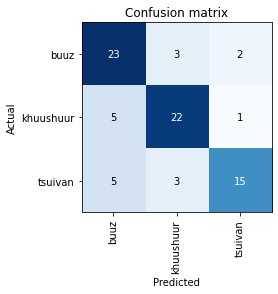

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

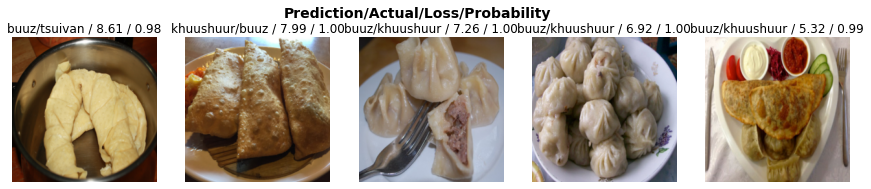

In [ ]:
interp.plot_top_losses(5, nrows=1)

### Data Cleaning (Vision widgets) 

Cleaning the training and validation set by changing the label of each element in the dataset. 

In [ ]:
cleaner = ImageClassifierCleaner(learn)
cleaner

In [ ]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()

In [ ]:
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

 I hope the images have been labeled correctly enough. Now, It is time to create a data loader and run our traning again in order to get more accurate results. 

In [ ]:
foods = foods.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = foods.dataloaders(path)

In [ ]:
learn = cnn_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(10)

epoch,train_loss,valid_loss,error_rate,time
0,1.852827,0.553038,0.240741,00:10


epoch,train_loss,valid_loss,error_rate,time
0,0.729383,0.332538,0.092593,00:09
1,0.688596,0.163381,0.037037,00:10
2,0.540662,0.128165,0.055556,00:10
3,0.427503,0.136627,0.055556,00:10
4,0.351264,0.123828,0.055556,00:10
5,0.303093,0.114614,0.037037,00:10
6,0.261957,0.097751,0.037037,00:10
7,0.228109,0.092990,0.037037,00:10
8,0.199815,0.095055,0.037037,00:10
9,0.176625,0.096200,0.037037,00:09


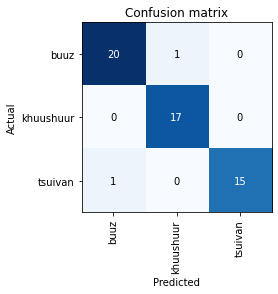

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

As we can see from this "Confusion Matrix" above, data has cleaned well. But I have to say good number of elements have been removed because there were lots of images that cannot be used for our traning. 

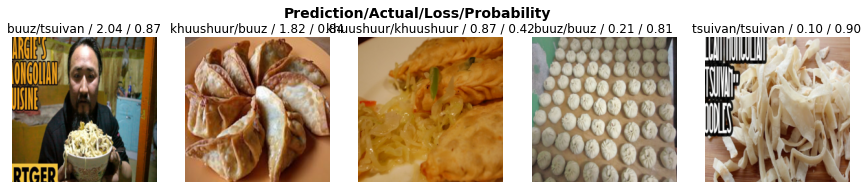

In [ ]:
interp.plot_top_losses(5, nrows=1)

## Things that I learned: 


*   Adding images manually was a really good idea. 
*   We should make our data as clean as possible. So, removed lots of images from the data.
*  I noticed that resnet34 and resnet18 are almost the same as long as we determine a small number of epochs. 





<img src="image.JPG" alt="Drawing" style="width: 200px;"/>

### Exporting the model

In [ ]:
learn.export()

In [ ]:
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

In [ ]:
learn_inf = load_learner( 'export.pkl')